In [1]:
pip install plotly jupyterlab

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
%matplotlib inline
import seaborn as sns
import plotly.express as px

In [5]:
df = pd.read_csv("sales_data.csv",sep = ",")
df.head()

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418


In [6]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113036 entries, 0 to 113035
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Date              113036 non-null  object
 1   Day               113036 non-null  int64 
 2   Month             113036 non-null  object
 3   Year              113036 non-null  int64 
 4   Customer_Age      113036 non-null  int64 
 5   Age_Group         113036 non-null  object
 6   Customer_Gender   113036 non-null  object
 7   Country           113036 non-null  object
 8   State             113036 non-null  object
 9   Product_Category  113036 non-null  object
 10  Sub_Category      113036 non-null  object
 11  Product           113036 non-null  object
 12  Order_Quantity    113036 non-null  int64 
 13  Unit_Cost         113036 non-null  int64 
 14  Unit_Price        113036 non-null  int64 
 15  Profit            113036 non-null  int64 
 16  Cost              113036 non-null  int

In [7]:
df.dropna(inplace=True)
df.drop_duplicates(inplace=True)

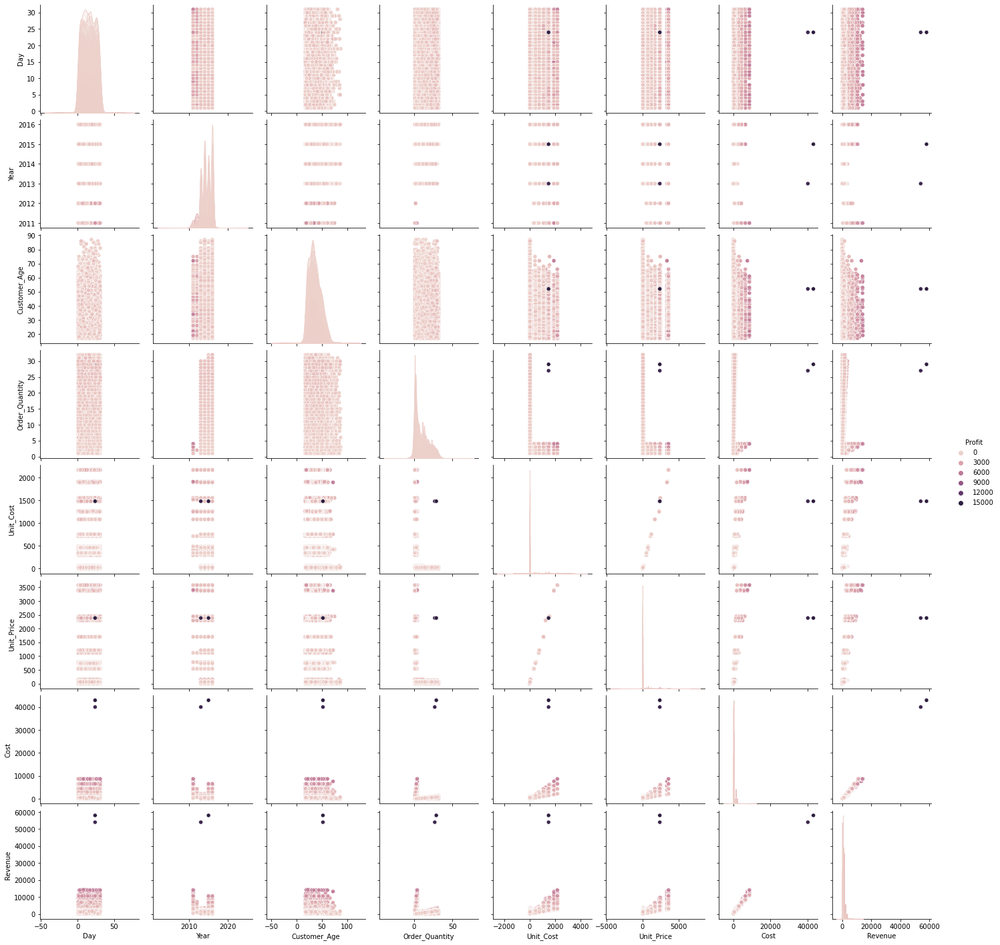

In [14]:
sns.pairplot(df, hue='Profit')

In [8]:
df_by_year = df.groupby(['Year'])['Revenue'].sum()
df_by_year

Year
2011     8951966
2012     9133795
2013    15117327
2014    14040192
2015    19945703
2016    17637789
Name: Revenue, dtype: int64

In [9]:
dy=df_by_year.reset_index()
dy

,Year,Revenue
0,2011,8951966
1,2012,9133795
2,2013,15117327
3,2014,14040192
4,2015,19945703
5,2016,17637789


<AxesSubplot:xlabel='Year', ylabel='Revenue'>

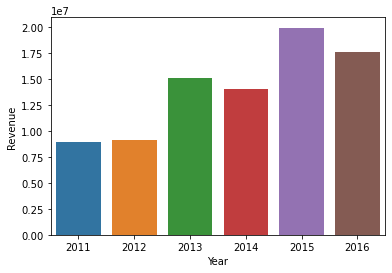

In [10]:
x = sns.barplot(x="Year", y="Revenue", data=dy)
x

In [11]:
df_by_yearMo = df.groupby(['Year','Month'])['Revenue'].sum()
df_by_yearMo

Year  Month   
2011  April        698782
      August       880037
      December    1132666
      February     635179
      January      675193
                   ...   
2016  January     2535084
      July         498424
      June        3568945
      March       2600455
      May         3249980
Name: Revenue, Length: 62, dtype: int64

In [12]:
am=df_by_yearMo.reset_index()
am

,Year,Month,Revenue
0,2011,April,698782
1,2011,August,880037
2,2011,December,1132666
3,2011,February,635179
4,2011,January,675193
...,...,...,...
57,2016,January,2535084
58,2016,July,498424
59,2016,June,3568945
60,2016,March,2600455


<AxesSubplot:xlabel='Year', ylabel='Revenue'>

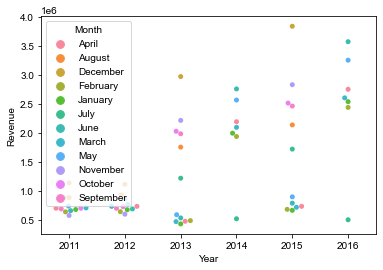

In [13]:
ax = sns.swarmplot(x="Year", y="Revenue", hue="Month", data=am)
sns.set(rc={"figure.figsize":(10, 10)}) #width=8, height=4
ax

In [14]:
df['Revenue_per_Age'] = df['Revenue'] / df['Customer_Age']

df['Revenue_per_Age'].head()

0    50.000000
1    50.000000
2    49.000000
3    42.612245
4     8.893617
Name: Revenue_per_Age, dtype: float64

<AxesSubplot:ylabel='Density'>

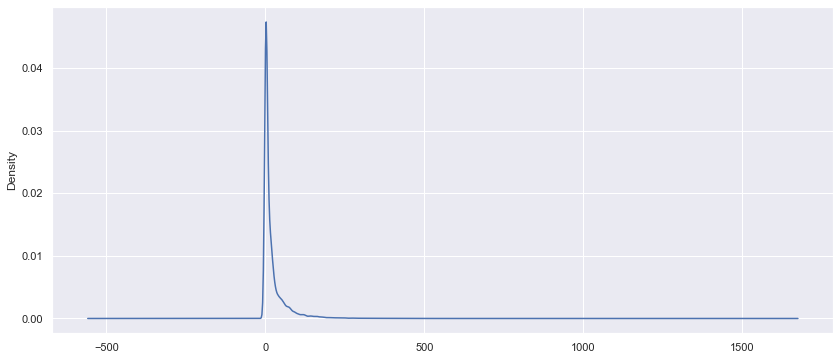

In [51]:
df['Revenue_per_Age'].plot(kind='density', figsize=(14,6))

<AxesSubplot:ylabel='Frequency'>

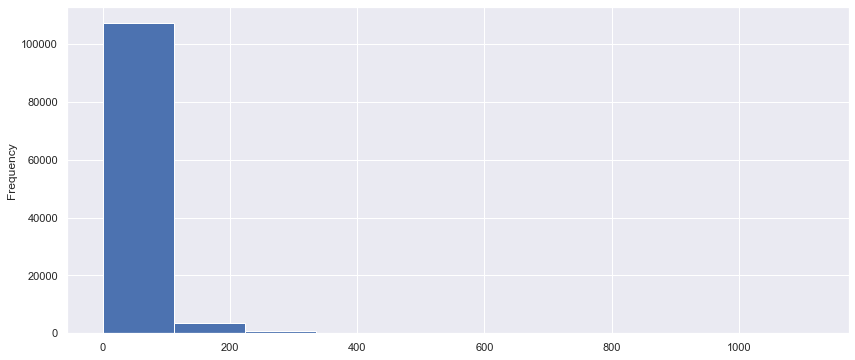

In [53]:
df['Revenue_per_Age'].plot(kind='hist', figsize=(14,6))

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


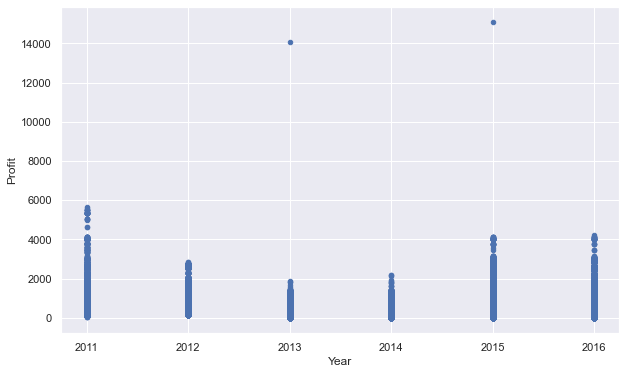

In [59]:
ds=df.plot(kind='scatter', x='Year', y='Profit', figsize=(10,6))


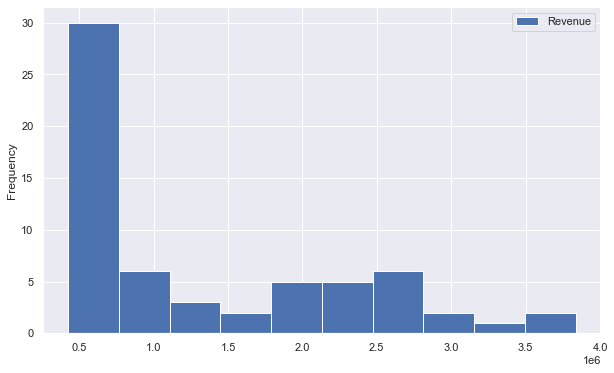

In [64]:
ds=am.plot(kind='hist', x='Month', y='Revenue', figsize=(10,6))


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


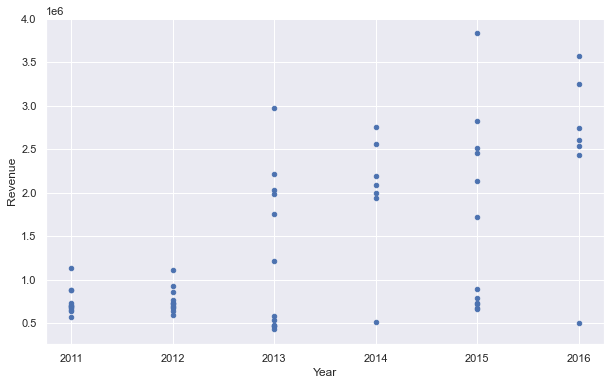

In [65]:
ds=am.plot(kind='scatter', x='Year', y='Revenue', figsize=(10,6))


In [72]:
df['Age_Group'].value_counts()

Adults (35-64)          55824
Young Adults (25-34)    38654
Youth (<25)             17828
Seniors (64+)             730
Name: Age_Group, dtype: int64

In [20]:
Age = df.groupby(['Age_Group','Month'])['Revenue'].sum()
Age

Age_Group             Month    
Adults (35-64)        April        3364407
                      August       2429716
                      December     4119427
                      February     3612745
                      January      3802329
                      July         2645984
                      June         5421194
                      March        4217000
                      May          4597909
                      November     2976840
                      October      2488980
                      September    2690650
Seniors (64+)         April          43669
                      August         10784
                      December       38372
                      February       21383
                      January        42734
                      July           28151
                      June           42058
                      March          12661
                      May            30717
                      November       16266
                      

In [21]:
Age.reset_index()

,Age_Group,Month,Revenue
0,Adults (35-64),April,3364407
1,Adults (35-64),August,2429716
2,Adults (35-64),December,4119427
3,Adults (35-64),February,3612745
4,Adults (35-64),January,3802329
5,Adults (35-64),July,2645984
6,Adults (35-64),June,5421194
7,Adults (35-64),March,4217000
8,Adults (35-64),May,4597909
9,Adults (35-64),November,2976840


In [49]:
plt.figure(figsize=(15,8))
graph=px.bar(df,x='Age_Group',y='Revenue',hover_name='Month',color='Month',title='Rainfall During 2000 to 2016')
graph.show()

<Figure size 1080x576 with 0 Axes>

In [33]:
monthly_revenue = df.groupby('Month').sum()
monthly_revenue.drop(columns=["Customer_Age"],inplace=True)
monthly_revenue.drop(columns=["Day"],inplace=True)
monthly_revenue.drop(columns=["Year"],inplace=True)
monthly_revenue

,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue,Revenue_per_Age
Month,,,,,,,
April,117348,2776163,4708055,2852086,4716788,7568874,233475.645060
August,102071,1776729,3009826,2205727,3487220,5692947,178897.614107
December,132105,3177139,5376944,3392298,5654025,9046323,284978.298589
February,104116,2539403,4298882,2550781,4255053,6805834,204920.976341
January,109344,2501983,4229355,2600859,4360307,6961166,203598.661106
July,89008,1858959,3142342,2128237,3563723,5691960,177534.548243
June,127499,3412620,5787055,3357787,5621030,8978817,259169.557754
March,110181,2673409,4530866,2747038,4559102,7306140,214355.930520
May,124616,3314720,5625457,3307882,5481405,8789287,262187.455394


In [89]:
yearly_revenue = df.groupby('Year').sum()
yearly_revenue.drop(columns=["Customer_Age"],inplace=True)
yearly_revenue.drop(columns=["Day"],inplace=True)

yearly_revenue

,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
Year,,,,,,
2011,5260,3111995,5144835,2881301,6083587,8964888
2012,5354,3111995,5144835,2951993,6223990,9175983
2013,294787,6749676,11477672,5959208,9280829,15240037
2014,379585,5245385,8976667,5864087,8288637,14152724
2015,289517,6749676,11477672,7528563,12495428,20023991
2016,370813,5245385,8976667,7035948,10677437,17713385
